## Survey-based forecasting

The statistical model estimated from the [Mørketallsundersøkelser](https://www.nsr-org.no/publikasjoner/morketallsundersokelsen) is one of the two approaches we have developed to forecast the occurrence of loss events for a given organisation. A key advantage of this model is its ability to yield forecasts on the *number* of expected loss events in a given time horizon. 

##### Background
The surveys are collected by the NSR (Næringslivets sikkerhetsråd) every other year. We have worked with data from 2016 to 2024 (5 surveys). Each survey contains around 1500-2500 Norwegian respondents (often done by the CISO of the organisation, or at least an employee responsible for the information security). Respondents are grouped along different covariates (industry, number of employees, etc. - see below).  We do not unfortunately have access to the raw responses, but have statistics about the number of respondents that selected a particular answer to a given question, both in total and factored along each covariate.

The covariates are the following:
- `antall_ansatte`: *"5 til 19 ansatte", "20 til 99 ansatte","100 ansatte eller flere"*
- `bransje`: *"Industri etc.", "Bygg- og anleggsvirksomhet", "Varehandel etc.", "Transport og lagring", "Overnattings- og serveringsvirksomhet", "Tjenesteytende næringer", "Offentlig administrasjon", "Undervisning", "Helse og sosial", "Kulturell virksomhet"*
- `sektor`: *"Privat", "Offentlig"*
- `samfunnskritiske_tjenester`: *"Ja", "Nei"*
- `rammeverk_for_informasjonssikkerhet`: *"Ja", "Nei"*
- `outsourcet`: *"Helt outsourcet", "Delvis outsourcet", "Organisert internt"*
- `landsdel`: *"Nord-Norge", "Vestlandet", "Østlandet", "Sørlandet inkludert TeVe", "Midt-Norge","Offentlig"*

We focused on questions related to the following aspects:
- the number of incidents in the past year
- the types of those incidents
- their consequences on the organisation
- how the incident was discovered
- the factors that contributed to the incident
- the financial and non-financial losses that followed the incident.

#### Modelling

Based on those responses, we have estimated various statistical models that take a list of *input features* describing the organisation (see above) and predict:
- the total number of incidents expected in a given period $[t, t+H]$
- the expected number of incidents of *a given type* in a given period
- other variables related to the *next incident* to occur (what would be its consequences, the factors that may contribute to it, etc.)
- the expected *time-to-incident* in days.

**Distribution of the number of incidents**

The responses from the surveys only tell us whether an organisation has experienced at least one incident in the preceding year. To derive a full a distribution over the expected number $n$ of incidents in a given period, we can use a Poisson distribution, which is well-suited to describe the occurrence of "rare" events:

$$P(n=k) = \frac{\lambda^i e^{-\lambda}}{i!}$$

where $\lambda$ is the *rate* of the process. To derive this rate, we start from the proportion $p$ of organisations that have experienced at least one incident in the preceding year (this can be directly derived from the survey responses). The probability of zero incidents according to the Poisson distribution is thus $e^{−\lambda}$, and the probability of at least one incident is, correspondingly, of $1−e^{−\lambda}$.  We can then solve $1−e^{−\lambda}=p$ and get $\lambda=−\log(1−p)$.  if we want the rate to be expressed in days, weeks or months instead of years, this can be easily adjusted by dividing the rate accordingly.  

**Mixture model**

The survey data gives us the number of respondents that have experienced at least one incident, both in total and depending on each of the 7 covariates enumerated above. We can therefore directly estimate from those numbers the probability that an organisation with 5 to 19 employees will experience an incident next year.  But we don't have any number for *combinations of covariates*, such as an organisation having 5 to 19 employees, working in the construction industry and located in Vestlandet. 

To address this shortcoming, we model the distribution over the number of incidents $n$ given the 7 input features $X_1 = x_1, ... X_7 = x_7$ as a Mixture-of-Experts (MoE) with a fixed gating function:
$$P(n=k |X_1 = x_1, ... X_7 = x_7) = \begin{cases} P(n = k | X_1 = x_1) & \text{with weight } w_1 \\ ... &  \\ P(n = k | X_7 = x_7) & \text{with weight } w_7\end{cases} $$
where $w_1, ..., w_7$ correspond to the weights that we attach to each of the 7 covariates that characterise the organisation.  Those weights are difficult to estimate precisely without having access to the raw data from the survey. We determine these weights by calculating the *proportion of variance* in incident counts that each covariate explains, under the assumption that covariates accounting for larger variations are more influential.


**Linear decay by year**

We have data for 5 consecutive surveys, from 2016 to 2024. Predictions based on more recent estimates should arguably weight more than older ones. To this end, we combine each mixture model described above as a linear combination of predictions for each of the five surveys, with a weight that decays linearly from the most recent, with a weight of $1$, to the oldest from 2016, with a weight of $\max(0, 1 -4 \times decay\_rate)$, where $decay\_rate$ stipulates the speed of the decay, and fixed to 0.2 in the current implementation.

**Confidence intervals**

Some of the model predictions will be more precise than others, depending on the number of respondents associated to them. For instance, the total proportion of organisations with more than 100 employees in the respondents is much lower than the proportion of organisations with 5-19 employees - and, as a consequence, the estimates on the number and types of incidents related to the former will have a higher uncertainty.

Our implementation takes this uncertainty into account by *bootstrapping* techniques to capture the full probability distribution associated with a particular query. More precisely, given a total number of respondents $N$ for a given question, and a proportion $p$ from those respondents that have selected a given answer, we sample from the binomial distribution $s \sim Binomial(N, p)$ and obtain a sample of alternative proportions $p' = \frac{s}{N}$ whose mean will converge to $p$ as $N$ grows.  

Bootstrapping allows us to obtain confidence intervals (set in our experiments to 95 \% confidence intervals) for each prediction. 

#### Implementation 

**Loading the forecaster**

The survey-based forecaster can then be loaded as follows:

In [1]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join('..')))
from lefsa import survey

survey_data = survey.SurveyData.from_json(json_file="../data/morketall.json")
forecaster = survey.SurveyBasedForecaster(survey_data)

Loading the survey-based forecaster...Done



**Input features extraction**

Determining the right values for the 7 covariates associated with a given organisation is not always straightforward. To facilitate this process, we have implemented a small functionality that relies on the OpenAI API to provide appropriate values for those features based on a short text description of the organisation (note: you need to have an OPENAI_API key set in your environment variables to get this to work):


In [4]:
feats = survey.OrgFeatures.from_description("Pizzaiolo AS, a small pizza restaurant in Bergen")
print(feats)

OrgFeatures(antall_ansatte='5 til 19 ansatte', bransje='Overnattings- og serveringsvirksomhet', sektor='Privat', samfunnskritiske_tjenester='Nei', rammeverk_for_informasjonssikkerhet='Nei', outsourcet='Delvis outsourcet', landsdel='Vestlandet')


**Inference**

The three core methods to employ for prediction are `forecast`, `forecast_by_type` and `predict_next_incident`. Those methods take as input an `OrgFeatures` object (see above), along with an optional specification of a return type: `mean` if one only wishes to obtain point estimates, `ci` for confidence intervals, or `samples` for a full set of sample values. 

In [5]:
import pprint
pp = pprint.PrettyPrinter(indent=2)

basic_forecast = forecaster.forecast(feats, return_type="ci")
forecast_by_type = forecaster.forecast_by_type(feats, return_type="ci")
next_incident = forecaster.predict_next_incident(feats, return_type="ci")

print("Basic forecast (probability of a least one major incident in the next 12 months):")
pp.pprint(basic_forecast)

print("\nForecast factored by incident type (NB: the types are not mutually exclusive):")
pp.pprint(forecast_by_type)

print("\nPredicted properties of the next incident:")
pp.pprint(next_incident)

Basic forecast (probability of a least one major incident in the next 12 months):
{'>=1': '4.5-23.7%'}

Forecast factored by incident type (NB: the types are not mutually exclusive):
{ 'Bedrageri': {'>=1': '0.6-8.8%'},
  'Datainnbrudd': {'>=1': '0.0-7.3%'},
  'Datatyveri': {'>=1': '0.0-1.2%'},
  'Digitalt skadeverk': {'>=1': '1.1-8.6%'},
  'Forsøk på datainnbrudd/hacking': {'>=1': '2.8-20.6%'},
  'Hacktivisme': {'>=1': '1.2-5.9%'},
  'Hendelse forårsaket av manglende kontroll på administrativ informasjonssikkerhet': { '>=1': '0.0-2.6%'},
  'Hendelse forårsaket av outsourcingsleverandør': {'>=1': '0.0-4.3%'},
  'Hendelser forårsaket av bedriftens ansatte': {'>=1': '0.0-15.9%'},
  'Løsepengevirus': {'>=1': '1.1-4.5%'},
  'Misbruk av IT-systemer': {'>=1': '0.0-4.7%'},
  'Penetrasjon av organisasjonens sikkerhetssystemer': {'>=1': '0.0-6.9%'},
  'Phishing eller andre sosial manipulerings angrep': {'>=1': '1.7-21.9%'},
  'Tap av opplysninger': {'>=1': '0.0-4.3%'},
  'Tapt forretningshemmeli

We have also implemented visualisation tools to help interpret the forecasts:

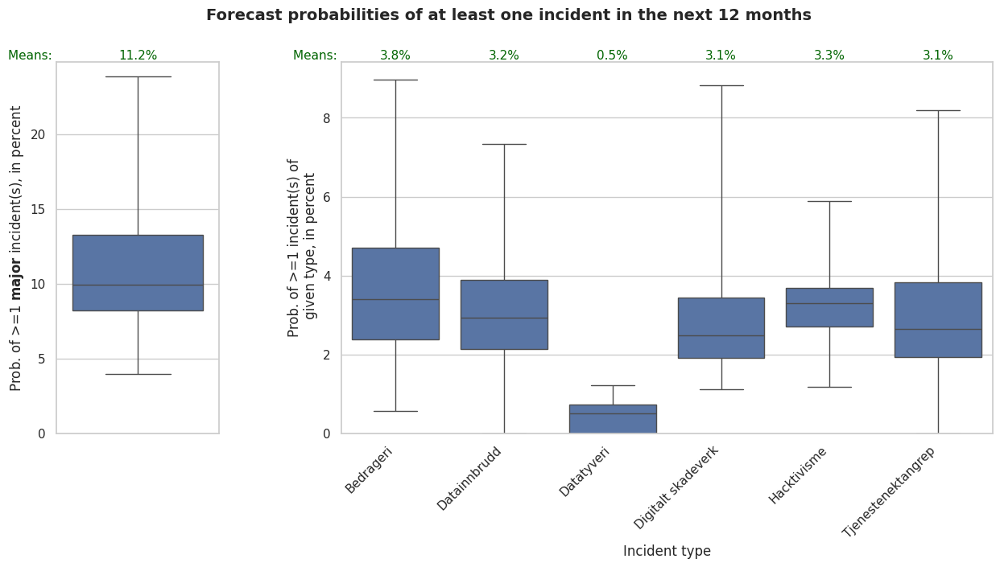

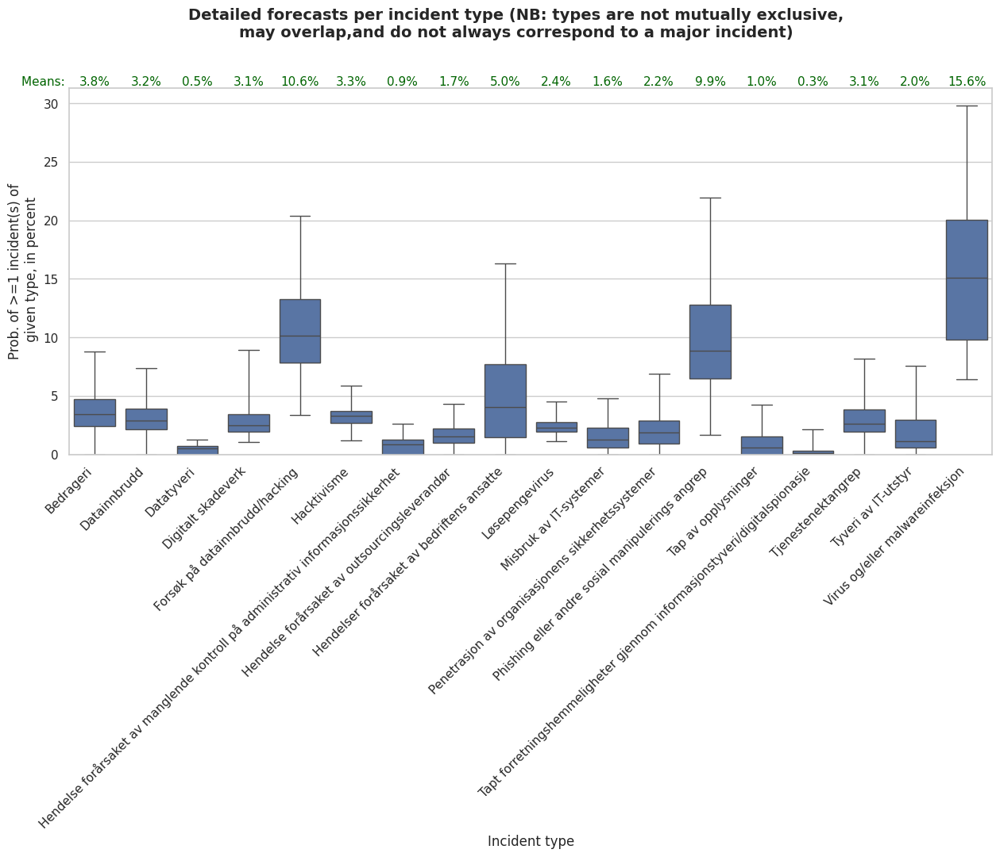

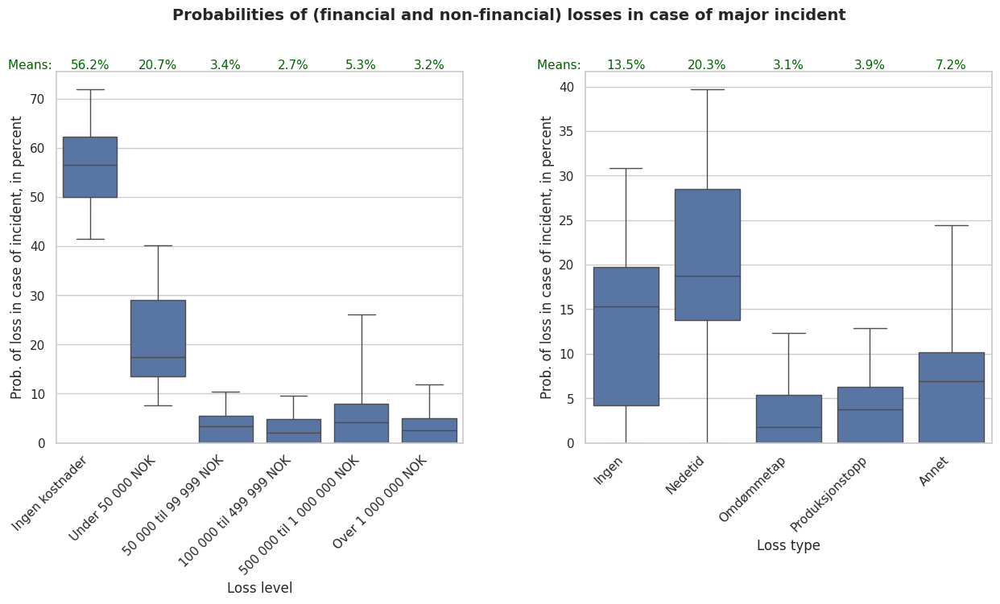

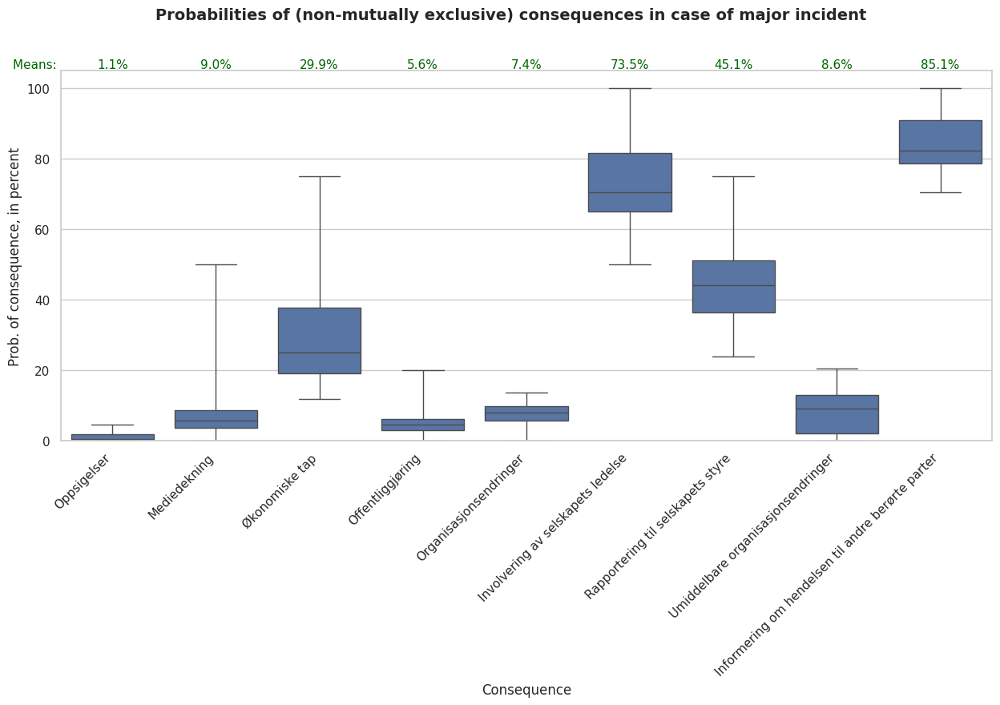

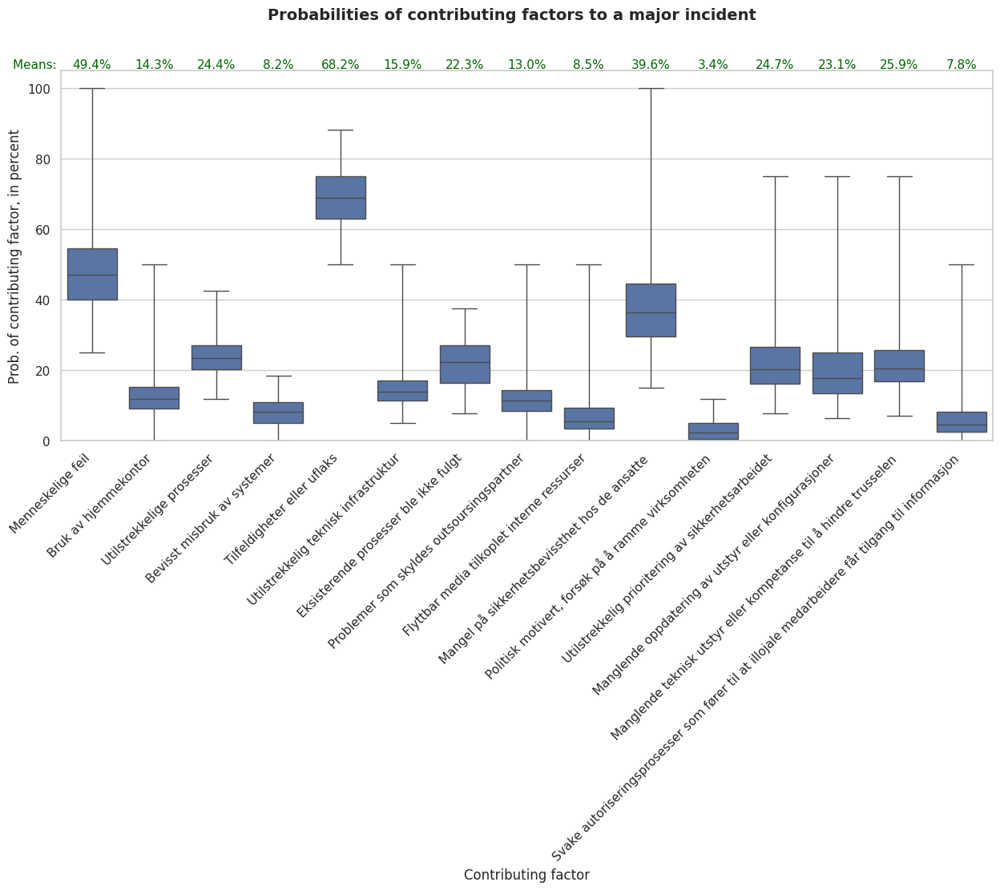

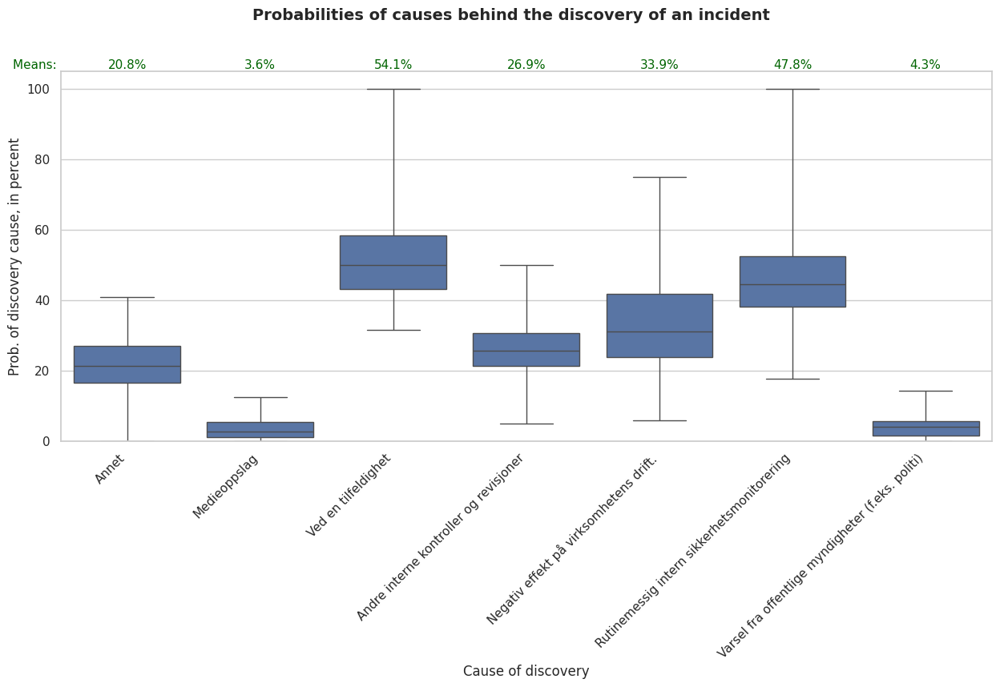

In [6]:
from lefsa import survey_plotting
visualiser = survey_plotting.ForecastVisualizer(forecaster)
for i, fig in enumerate(visualiser.plot_all(feats)):
    display(fig)

T
he forecasting results can also be analysed as a function of each of the 7 covariates:

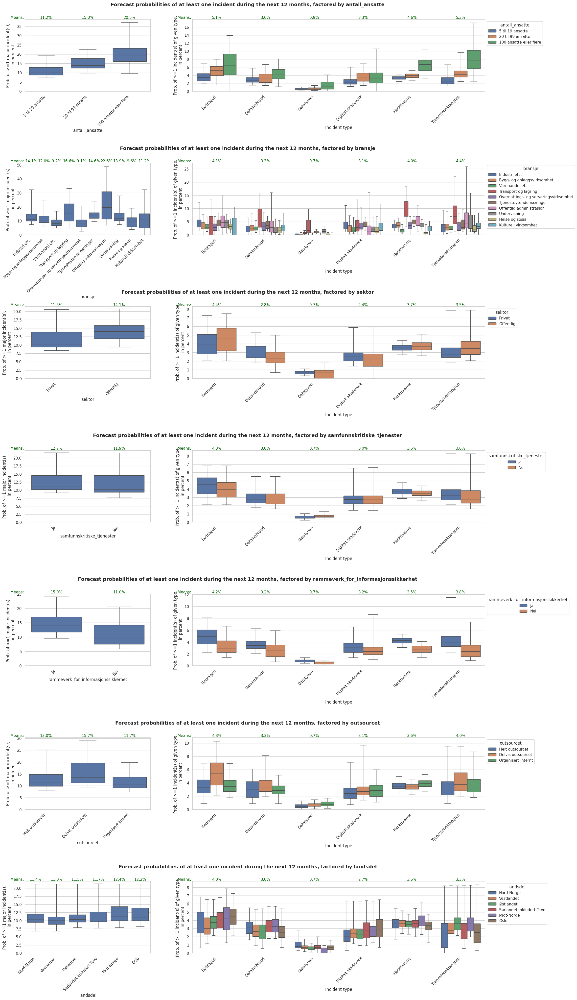

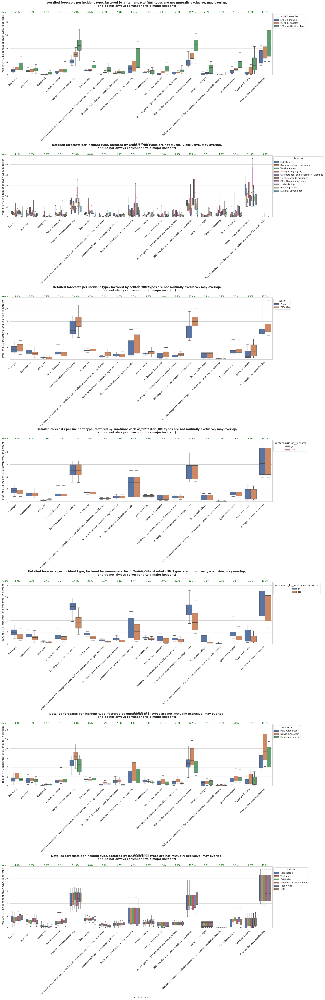

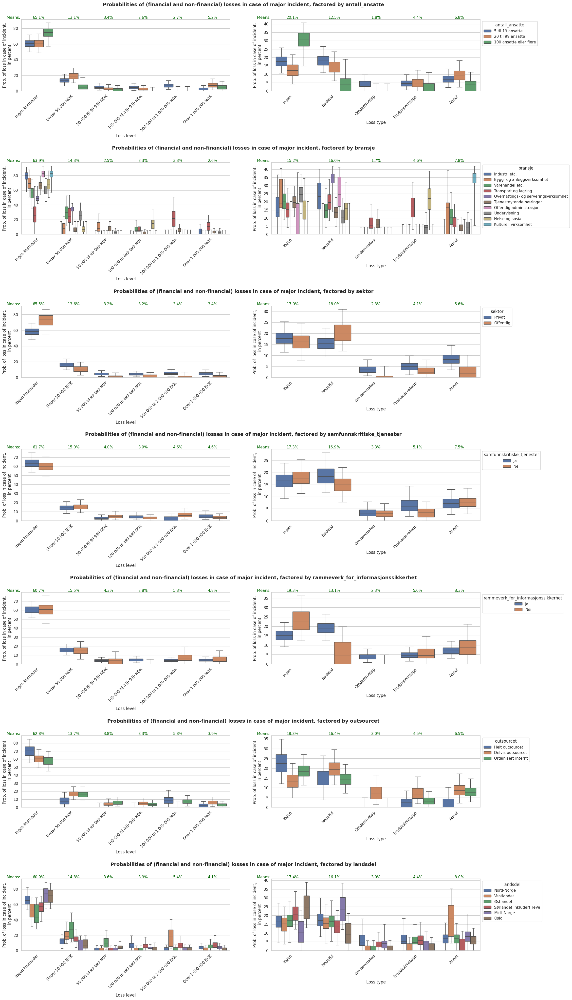

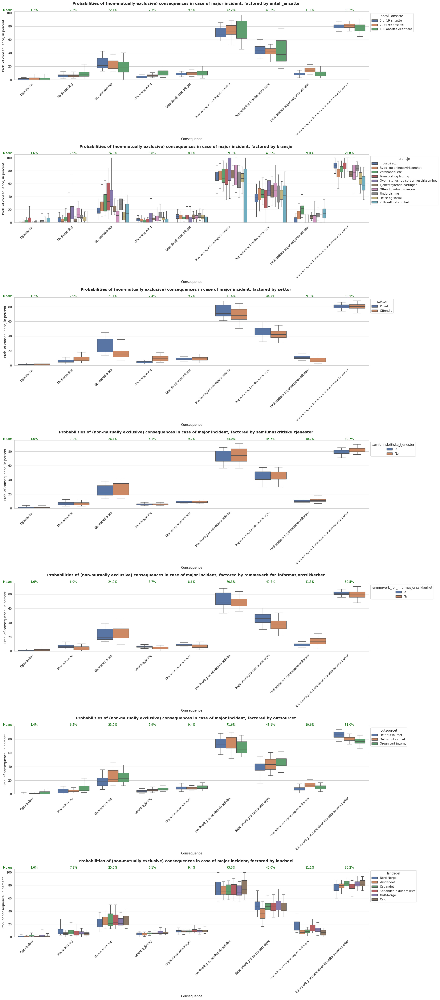

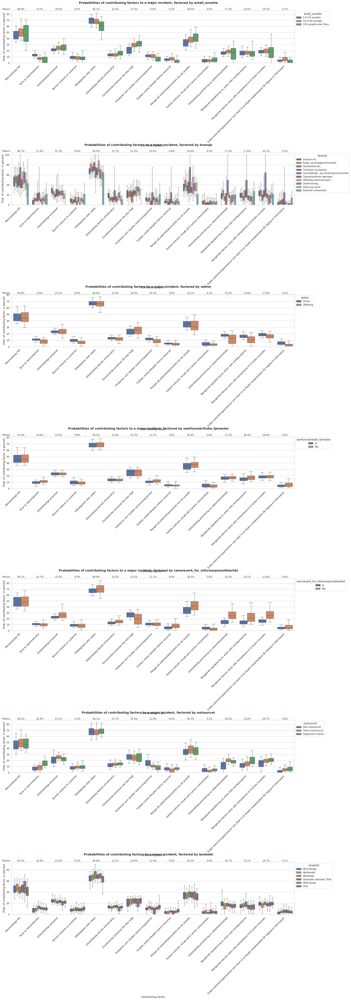

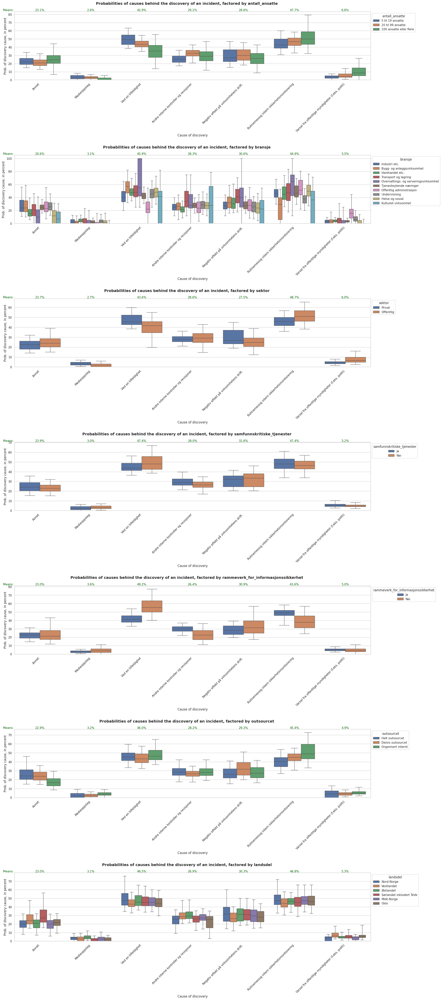

In [16]:
for fig in visualiser.plot_all_by_covariate():
    display(fig)